# <font color='blue'> Table Of Contents </font>

### <font color='blue'> Prerequiste  </font>

### <font color='blue'> Details of the example and the steps involved  </font>

### <font color='blue'> Python Code Walkthrough  </font>

### <font color='blue'> Setting up EC2 instance </font>

### <font color='blue'> Assign IAM role to EC2 instance </font>

### <font color='blue'> Install Putty , connect  EC2 instance via putty </font>

### <font color='blue'> Setup and run the python code </font>

### <font color='blue'>  Use Case 1 -  Document conversion to PDF  </font>

### <font color='blue'>  Use Case 2 - Cloud backup and automatic lifecycle management </font>

# <font color='blue'>  Problem statement </font>


Consider a medical facility where several patients are getting treatment, in such places, regular health monitoring of each individual is a necessary requirement. Using IoT and Cloud services, a system can be set up that collects individual health data and sends it over the cloud for further processing, monitoring, detecting abnormal events, raising an alarm or notifying the concerned authorities. We’ll see how to design such a solution using cloud services.

We will be covering various pieces of cloud components listed in the use-case image given below in our upcoming mentoring sessions every week and in the end we will connect everything together. 

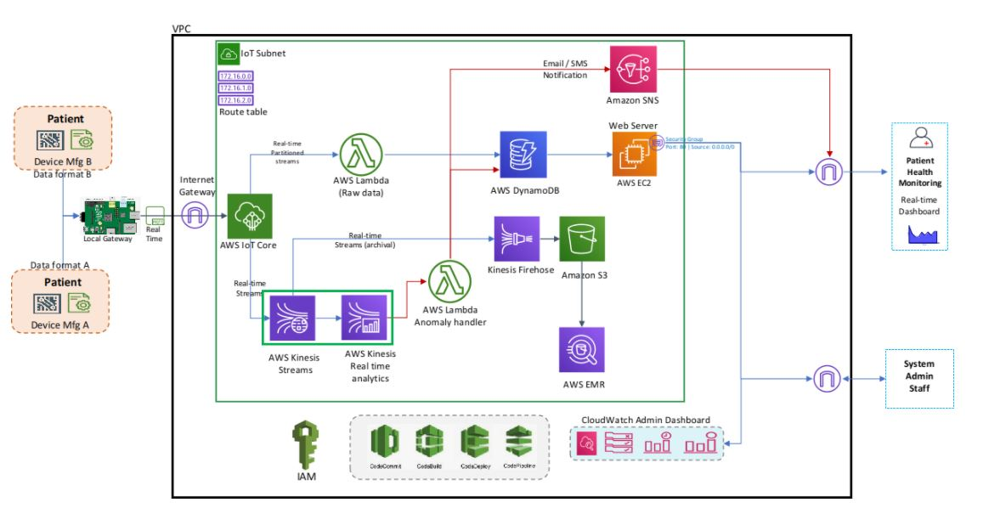

In Week 1 Mentor Lab we are doing the following - 

In the IoT module data is generated and pushed on DynamoDB. In the cloud module the first week tasks are mentioned below:


* EC2 instance setup, mentors can share the basic idea of various things such as  instance type, EBS, networking, AMI, etc.
Show ssh connection to the server using putty
* Complete the Python setup or validate that it's set up. Once done upload the python script on the newly created instance to the server.
* Within the script:
    * Use AWS enabled APIs to access data from DynamoDB, IoT things and S3 bucket.
    * Get the previous day based on the current date when the script starts.
    * For all timestamps in range of the previous day (12:00:00 to 23:59:59), get all the records per device id, transform them in a row with an initial header row mapped to the json attributes and create one csv per device id.
    * Name can be something like <device_id>-<day in iso date format yyyy-mm-dd>-raw-data.csv
    * Highlight the fact that it is better to create a structure in s3 for efficiency and ease of browsing. Currently the structure is something like this: 
        
        * Each device id can have a folder in the bucket. Within that, we can create one folder per year. Each year's folder will have a month wise folder and then store the corresponding data in it. So everytime check if device id and within that, say the corresponding month ('yyyy-mm') folders exist (or create them) and add the csv in it. A new folder should get created at the beginning of the month inside each device id folder when trying to save the csv for the 1st day of the month.
        * Current structure is mentioned below: 
        
        bucketname/HeathCareDaraArchive/deviceid/year/month/deviceid-date.csv


# <font color='blue'>  Prerequiste </font>

   You should create a new dynamodb table along with the data by using the newly updated script (BedSideMonitor.py) before running this script we are providing this week . Please note down the dymano db table name and also verify that the columns deviceid and timestamp are present in the dynamo db table

   Ensure Bucket is created in S3 , please do follow the steps in case if it is not created 
   
   1. Login to the AWS Educate account
   2. Type s3 in the search box
  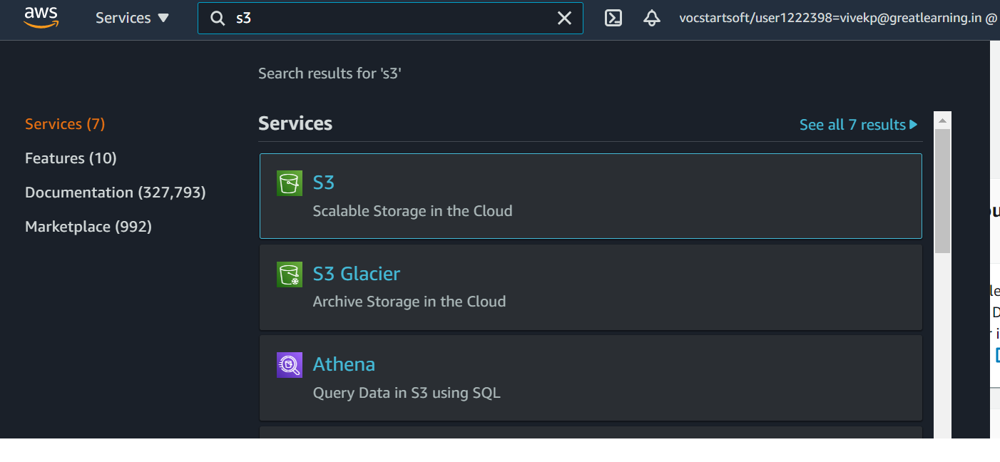

   3. Click on Create Bucket Button in the window
      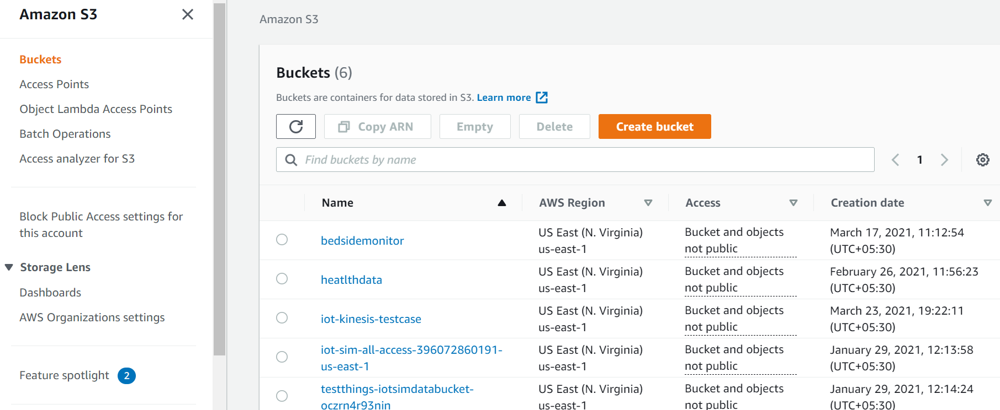
   4. Provide the bucket name which is unique globally
    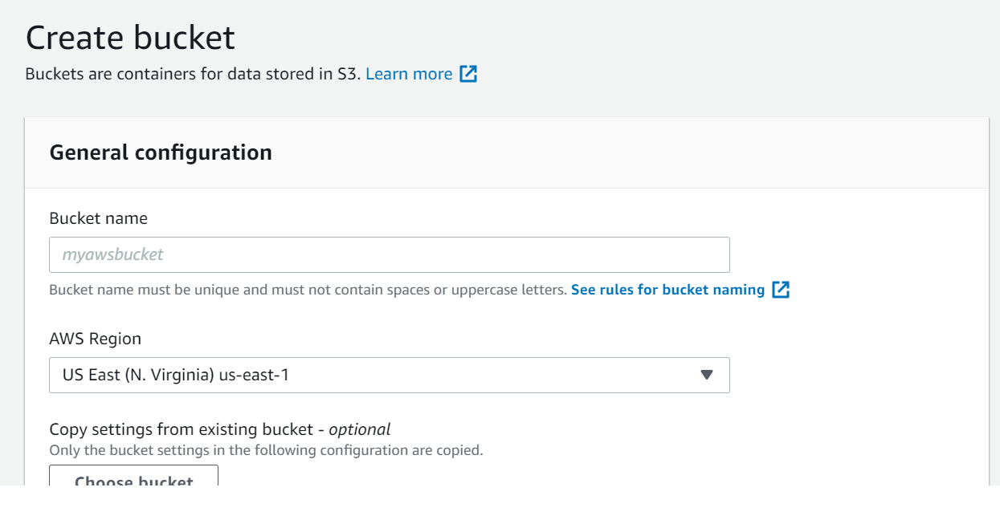
    
   5. Chose the region where your dynamo db and other services being created
  
   6  Leave all the options as default and click on Create Bucket  button 
    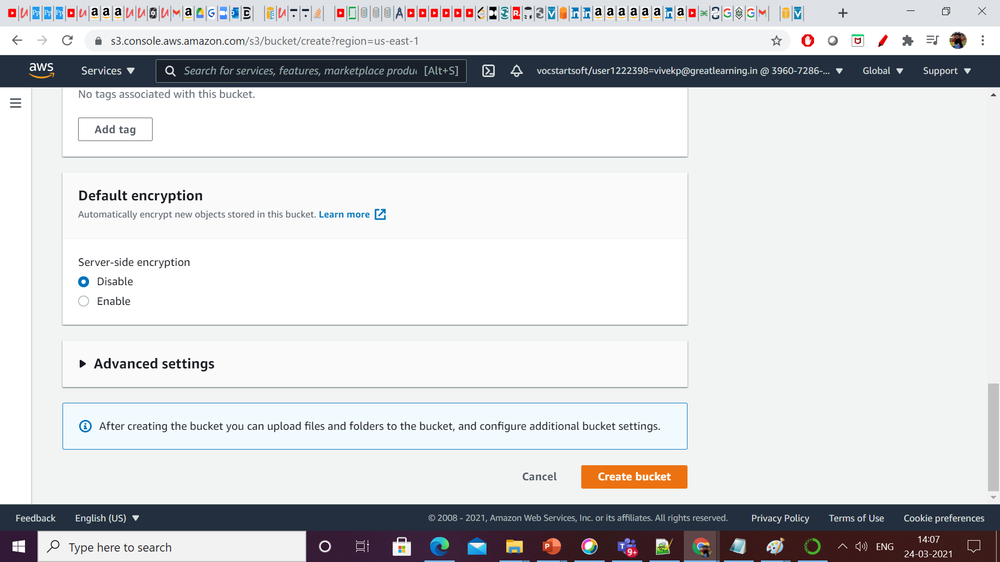
     
   7. Once it is created , please go the bucket dashboard and see your bucket has been created
   
     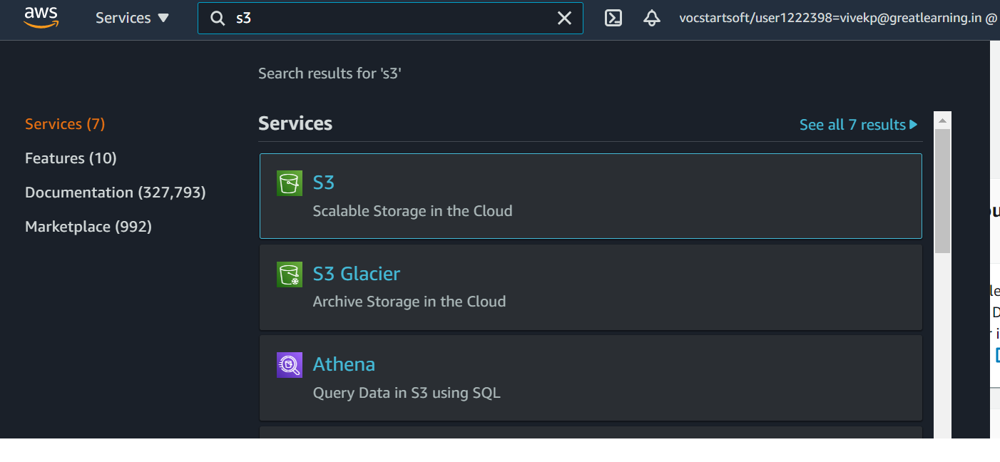


# <font color='blue'>  Details of the example and the steps involved  </font>
  
  In this lab, we are going to go through a complete workflow that enables to  push and store data in the S3 bucket from dynamo db (Bed side Monitor data)  using python script  running in EC2 instance . The idea of this use case to take back up of each device id in the S3 bucket from dynamo db per day .This will help us to easily browse the data by device id and able to get various insights out of the data.
  
This data is generally fed into EMR/Spark and other long term historical analytic processing. We can then later choose to delete older data from dynamodb (not covered here)

The python script which is going to run in the EC2 instance will do the below steps 
  
 1. First query the device ids (thing names) from the IOTCore   
 2. Loop through the device id list, query the dynamo db for the previous day data, save the file as .csv in the EC2 machine and upload the files to S3 bucket.
  
 This will help us to take back up of data in S3 per device id every day once. In real situations, this would generally be run by a cron job every day for the previous day's archival.

More details are provided in the following section:

# <font color='blue'>  Python Code Walkthrough </font>

The complete template source code is provided as a companion python file called ```BSMDataS3Archival.py```

1. Import required libraries and create objects for S3, DynamoDB and IOT.  Please use Boto3 to create IOT client, S3 client and dynamo db 

`
import csv
import boto3
from boto3.dynamodb.conditions import Key, Attr
import datetime
import os
import json
`


`
iot_client=boto3.client('iot',region_name ='us-east-1')
s3 = boto3.resource(service_name = 's3')
dynamodb_resource = boto3.resource('dynamodb',region_name='us-east-1')
`

Please ensure you provide the right dynamo db table name that  you created in the previous lab 

`table = dynamodb_resource.Table('bsmcloudtest')`


2. By using boto3 library for IOT - list_things api, please do query all the deviceid assoicated to the thing type. Please ensure you provide the thing type name you have created in the previouslab.

`response = iot_client.list_things(maxResults=100, thingTypeName='HealthCare')`

The output is a JSON from which we parse the things using the code response["things"] and adding to the list- deviceids

`
    devices = response["things"]
    device_ids = []
    for y in devices:
	    device_id = y["thingName"]
	    device_ids.append(device_id)
`
    
3. Get the previous date and current date. Using the previous date and current date column, you can query the dynamo db database you have created in the previous session, by passing the device id from the list . The idea is to take back up of the data from the dynamodb per device id per day and store it in S3 which enables users to query the data. Please ensure you use the latest code created in the previous lab which has column name as deviceid and timestamp. In case if you like to query the data for a particular date, please provide the dates manually as given below 

`condition = Key('deviceid').eq(deviceid)& Key('timestamp').between('2021-03-19','2021-03-20')`
        
4. we use table.query function to query the data from the dynamo db
`responsevalues=table.query(KeyConditionExpression=condition)`

5. Once we take the data , we store the data in CSV file with the format below
      
`filename = deviceid + "-" + str(prevYear) + "-" + str(prevMonth) + "-" + str(prevDay) + ".csv"`

6. Then the files which got created in EC2 instance are copied to the S3 path below. Please ensure you create/edit the bucket name (healthdata)  with your own bucket name.

`s3.meta.client.upload_file(Filename = filename,Bucket="healthdata",Key=key+filename)`
  
  The top-level folder will be HealthCareDataArchive. Within that each deviceid will have its own folder. Under that, there will be year and month folders. This ensures limited file count in each folder for manual browsing ease and efficiency. It also structures the files with relevance so traversal is more coherent.
  
The files will be uploaded in the following S3 path which is Bucketname/"HealthCareDataArchive/"+ deviceid + "/" + str(prevYear) + "/" + str(prevMonth) + "/" . 
  
`key = "HealthCareDataArchive/"+ deviceid + "/" + str(prevYear) + "/" + str(prevMonth) + "/"`
   
  The idea behind this s3 path is to enable users to query the data by deviceid by date and see how the values has been changing over the period of time.

  


# <font color='blue'> Set up an EC2 instance </font>

In this section we will set up an EC2 instance 

1. Login in to the AWS Educate Account
2. Type EC2 in the search box of list of services


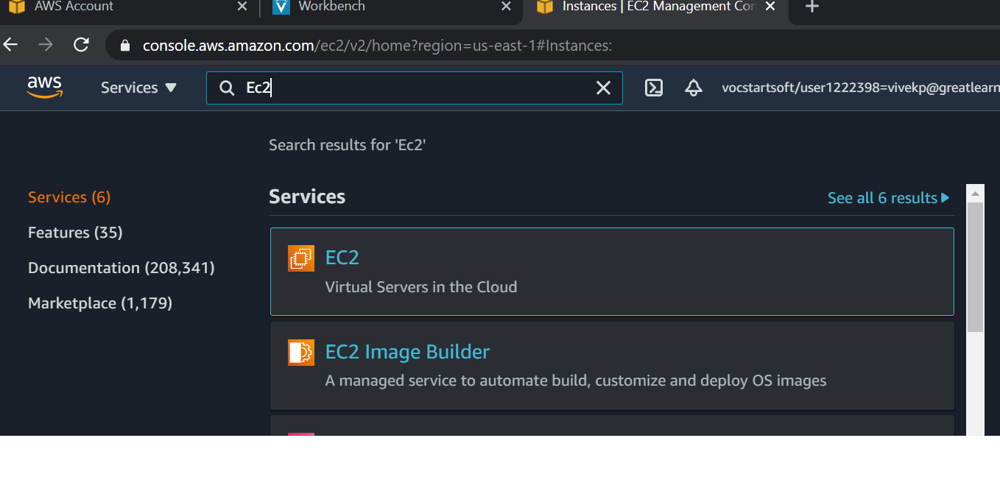

3.On the EC2 dashboard, click on instances on the left hand side menu

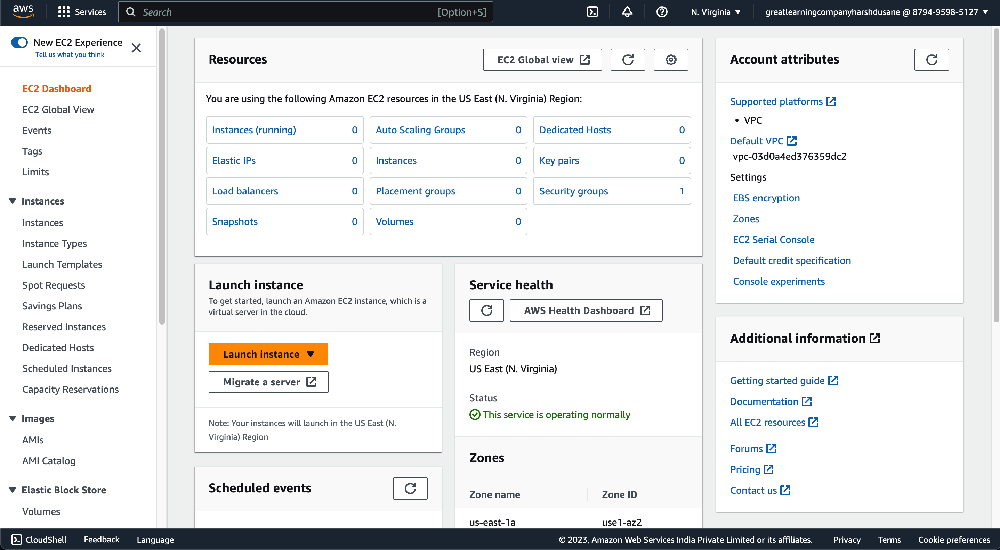

4. On the right hand side, click on Launch Instances

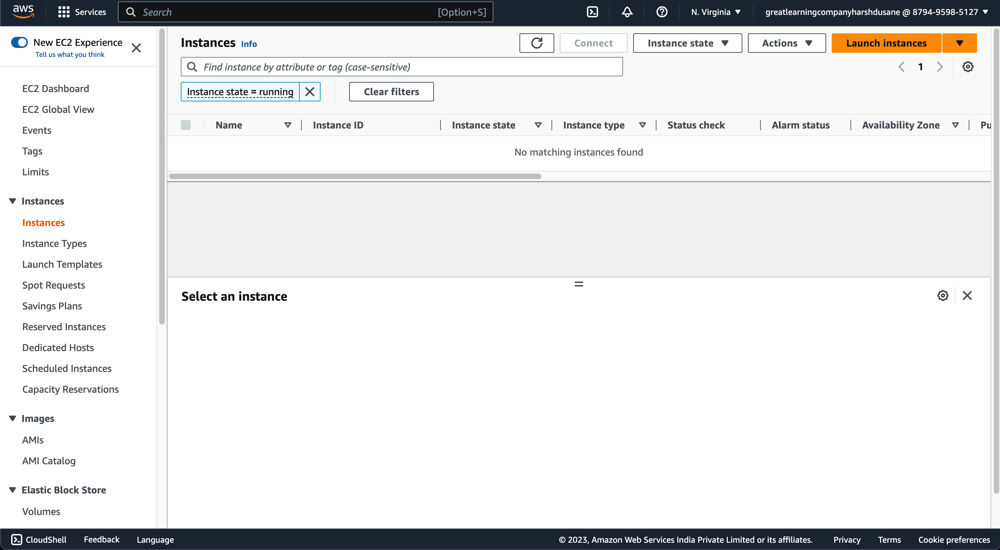

5. An Amazon Machine Image (AMI) provides the information required to launch an instance. Choose the AMI as Amazon Linux 2 AMI (HVM), SSD Volume Type. You can choose any other Linux OS as well if you are comfortable with the configuration on that.

    An AMI includes the following:
    
   a. One or more Amazon Elastic Block Store (Amazon EBS) snapshots, or, for instance-store-backed AMIs, a template for the root volume of the instance (for example, an operating system, an application server, and applications).

   b.Launch permissions that control which AWS accounts can use the AMI to launch instances.

   c.A block device mapping that specifies the volumes to attach to the instance when it's launched.

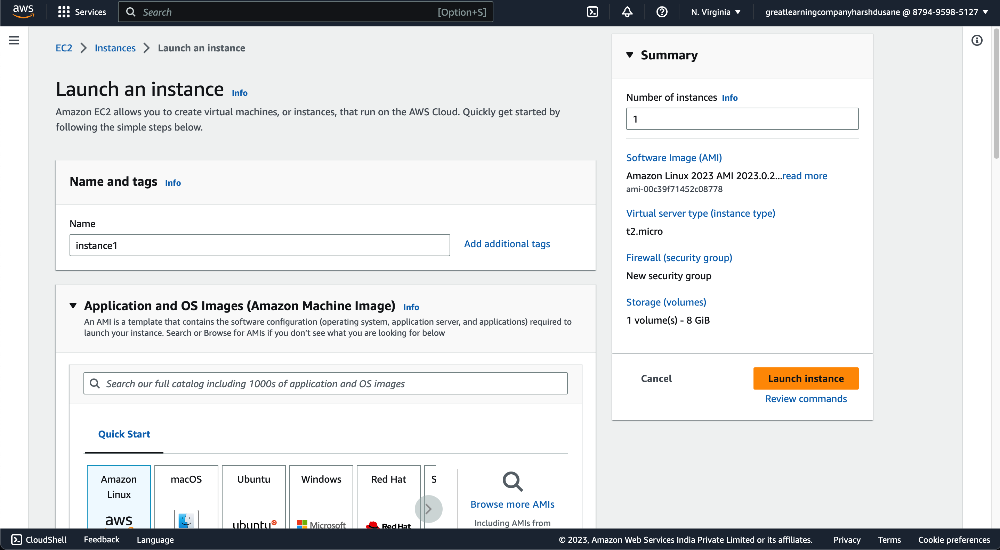

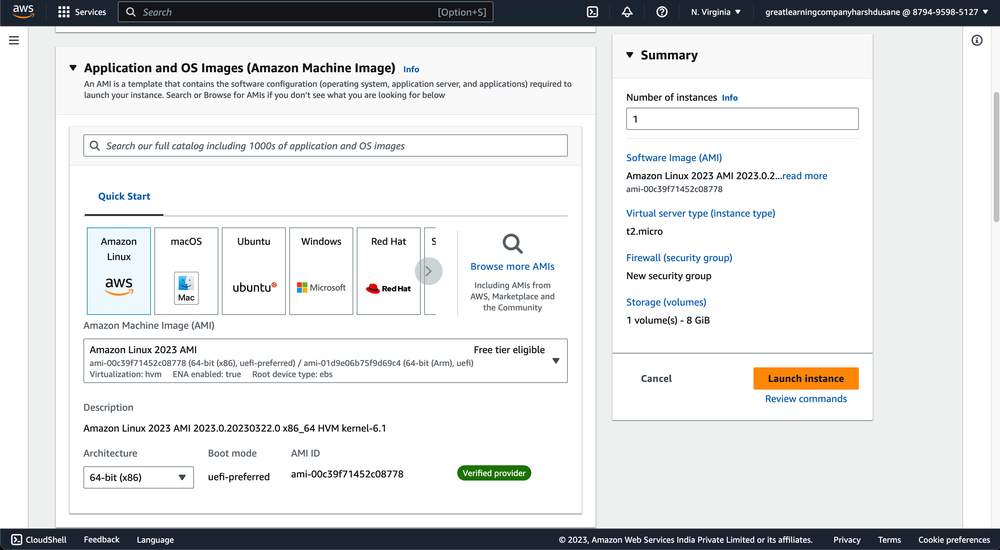

6. Instance types comprise varying combinations of CPU, memory, storage, and networking capacity and give you the flexibility to choose the appropriate mix of resources for your applications. Each instance type includes one or more instance sizes, allowing you to scale your resources to the requirements of your target workload.Please do refer to this documentation for various types of instace types and their purpose

      https://aws.amazon.com/ec2/instance-types/

    Choose an Instance type (T2 micro - FreeTier). Leave Instance details, storage and tags as per default configuration. Please leave the security group as default values and ensure SSH is enabled in the security group.  Review all the changes made and click on Launch

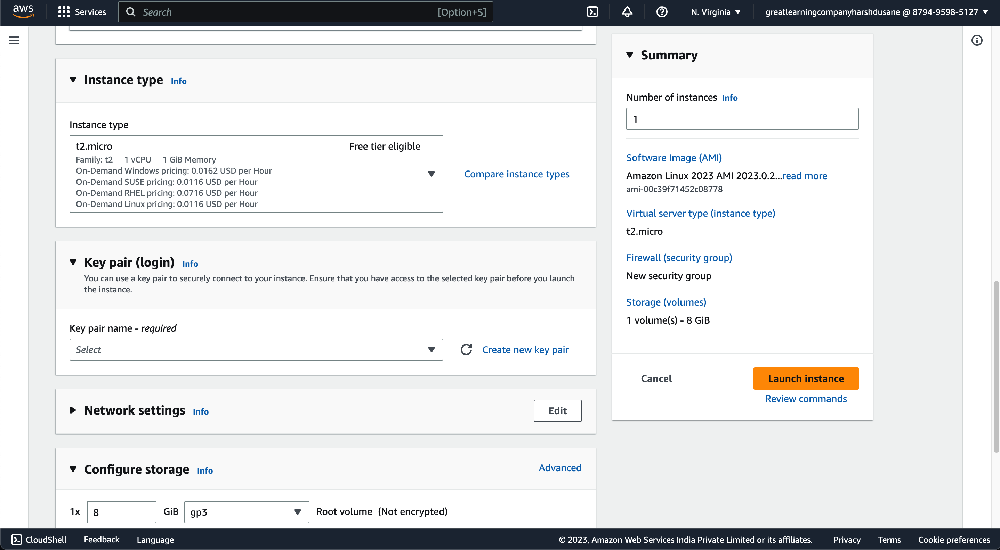

7. Please create a new key pair value
8. Provide the key pair name a value and download it. Please keep this private key handy as we will be using puttygen to convert into PPK file

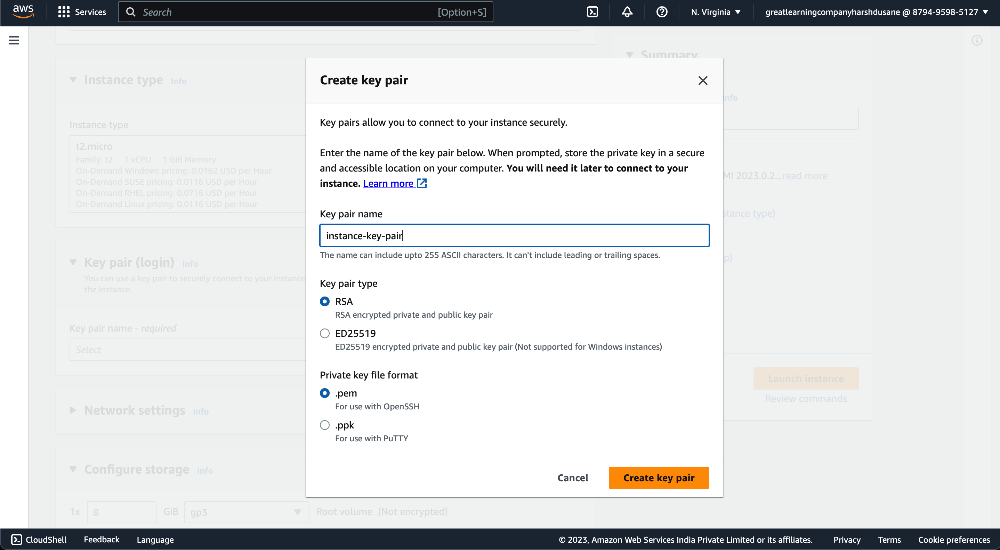

9. Configure the network settings as shown below:

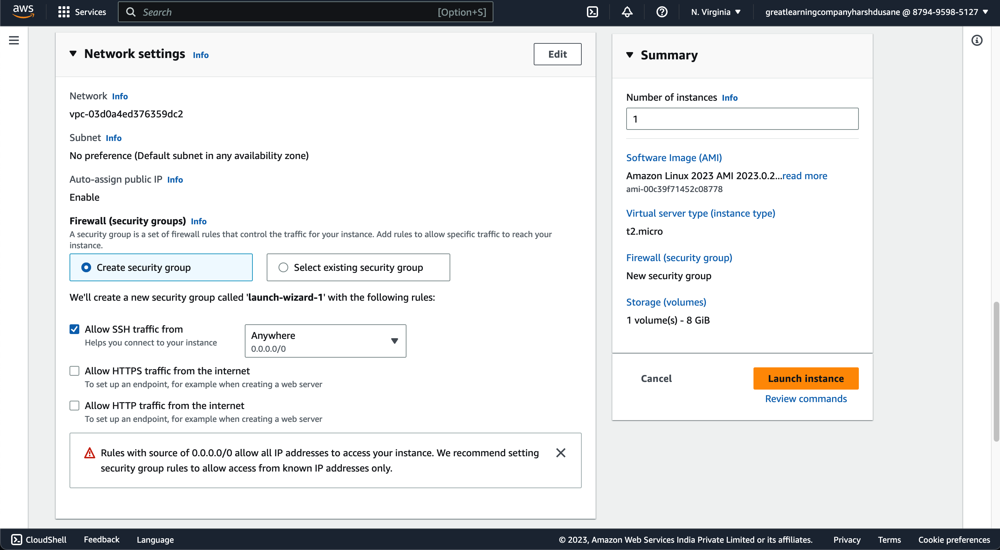

10. Click on `Launch Instance`

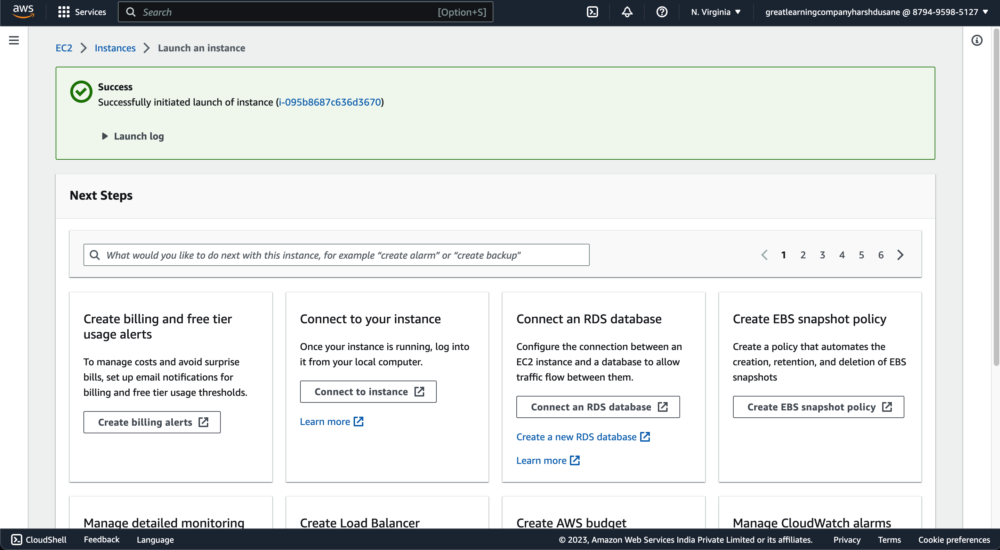

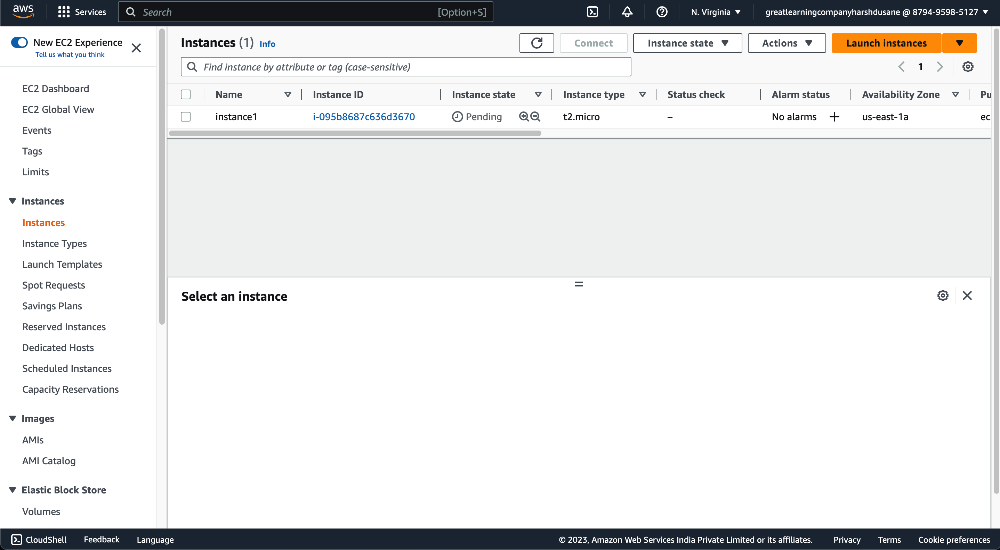

# <font color='blue'> Assign IAM role to EC2 instance </font>

In this section we will assign IAM role to EC2 instance.

1. Go to the EC2 dashboard, Select the newly created instance in the check box and click on Actions -> Security -> ModifyIAM Role

   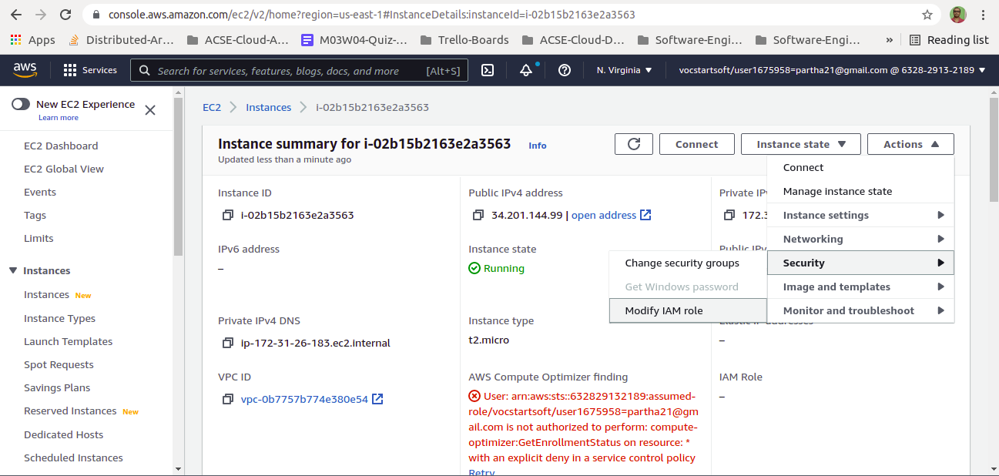

2. Click on Create new IAM role which will take you IAM dashboard    

   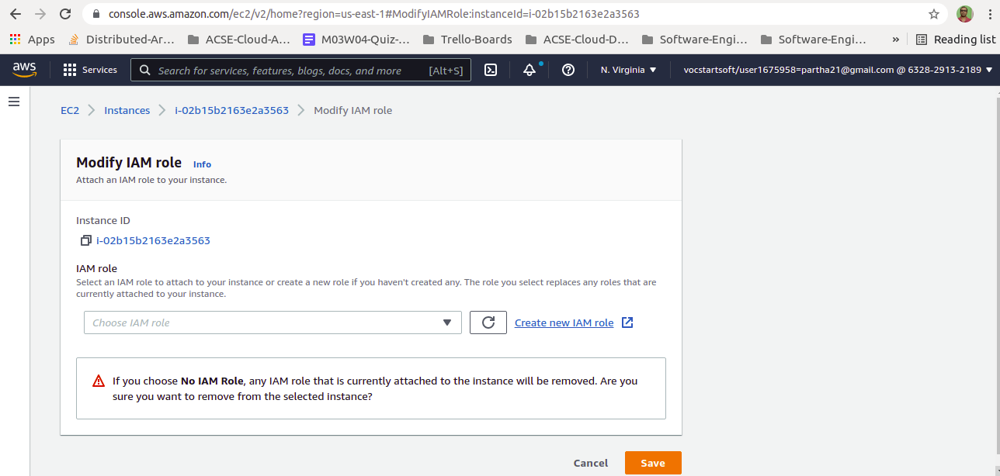

   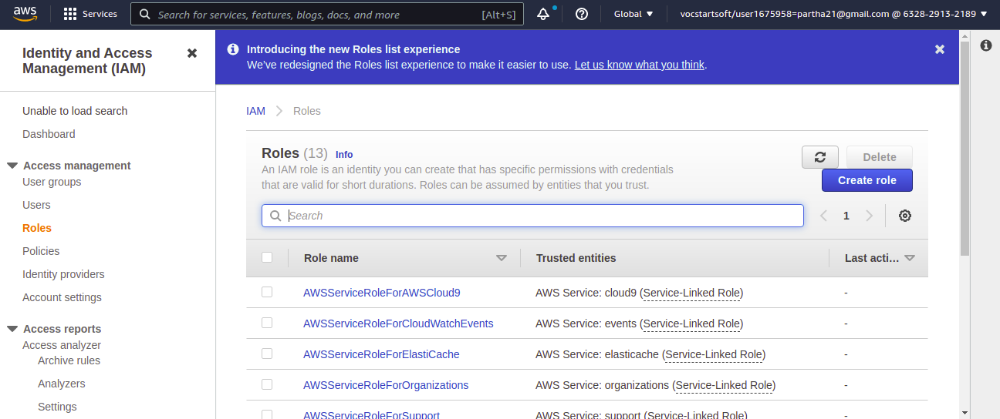

3. In the create Role, select AWS Service as EC2   

   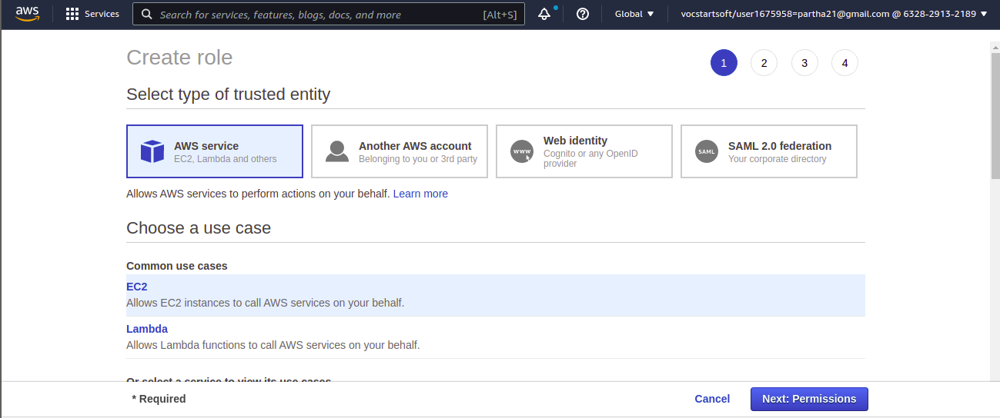

4. In the Attach permission policies, search AmazonS3Fullaccess, AmazonDynamoDBFullaccess and AmazonIOTFullAccess, and select all of them.

5. In the Review section, ensure all the policies are selected and provide a name to the role and click on Create Role.   

  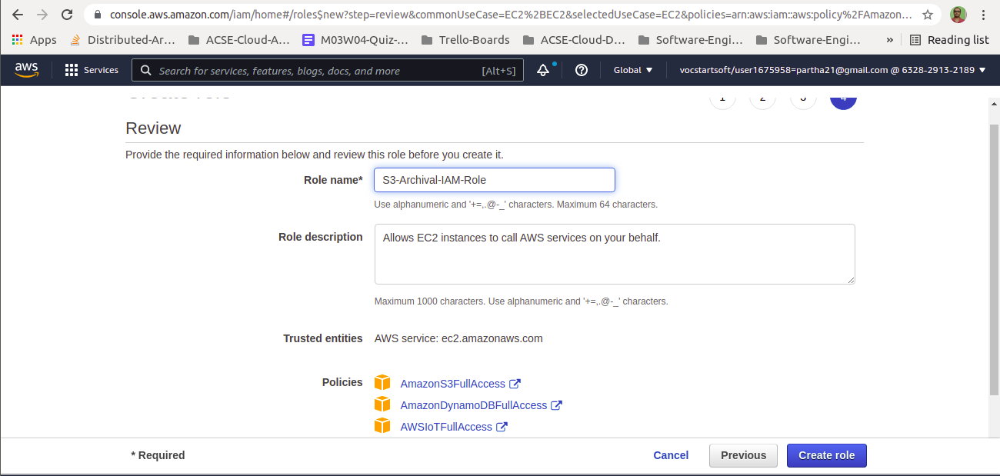
   
6.  Go to the EC2 dashboard and click on refresh button . In the drop down, you will find the newly created role which you need to select and save it.   

7. Verify that the role is saved properly in the EC2 dashboard.


# <font color='blue'> Install Putty , connect  EC2 instance via putty </font>

In this section we will install Putty and connect  EC2 instance via putty    

1. Download the putty from the URL https://www.chiark.greenend.org.uk/~sgtatham/putty/latest.html if not already installed in your system. Choose appropriate msi based on your system configuration

   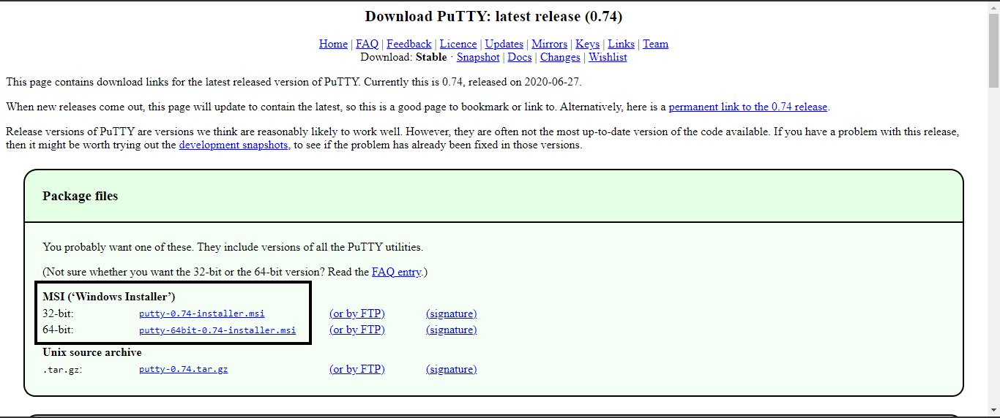
   
2. Once installed search for putty gen

  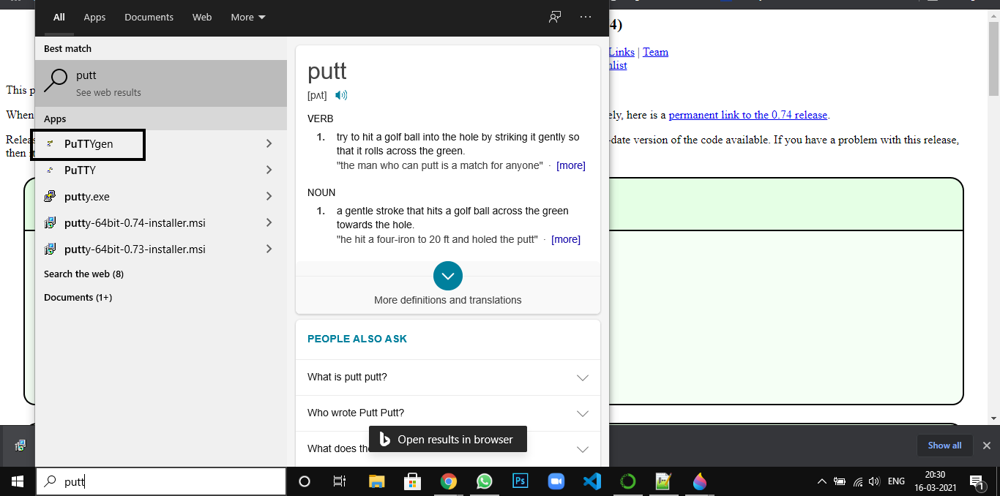
   
3.  Once you click on the Load , it will request you to locate the PEM file which you downloaded in the section 1 of the EC2 instance   
   
  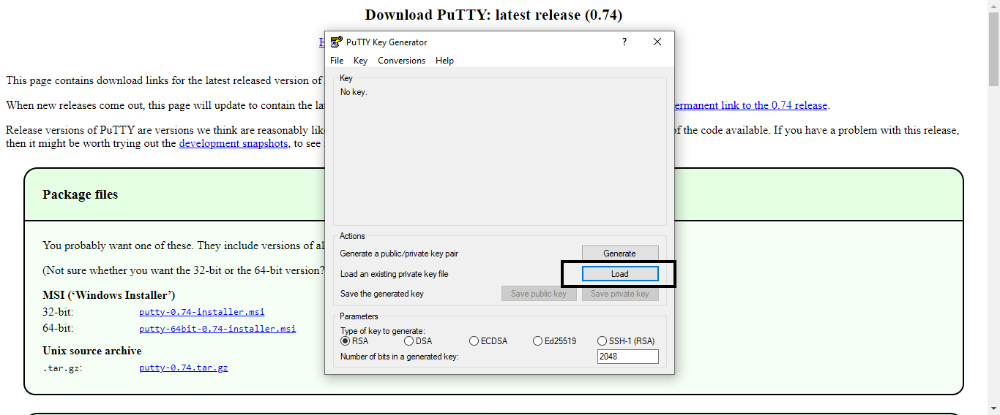
   
4. Once it is loaded , please click on button ```Save PrivateKey``` which will help to convert into PPK file   
   
  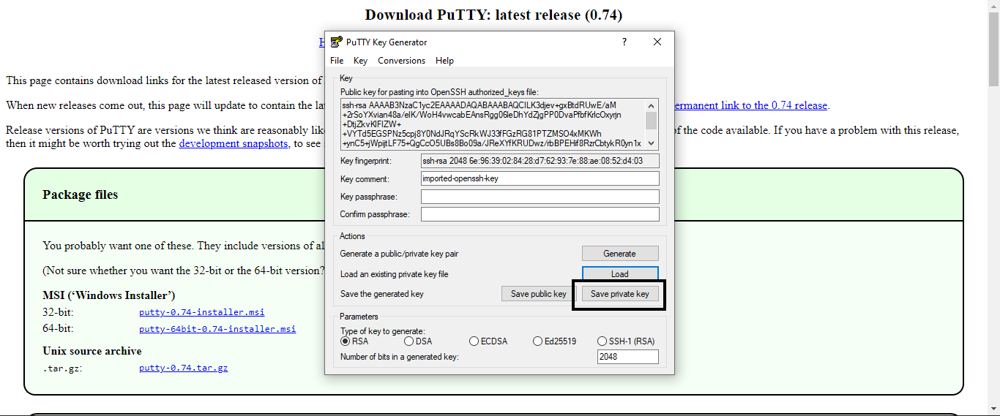
   
5. Go to the EC2 dashboard again , and select the instance you created and click on ```Connect```   
   
   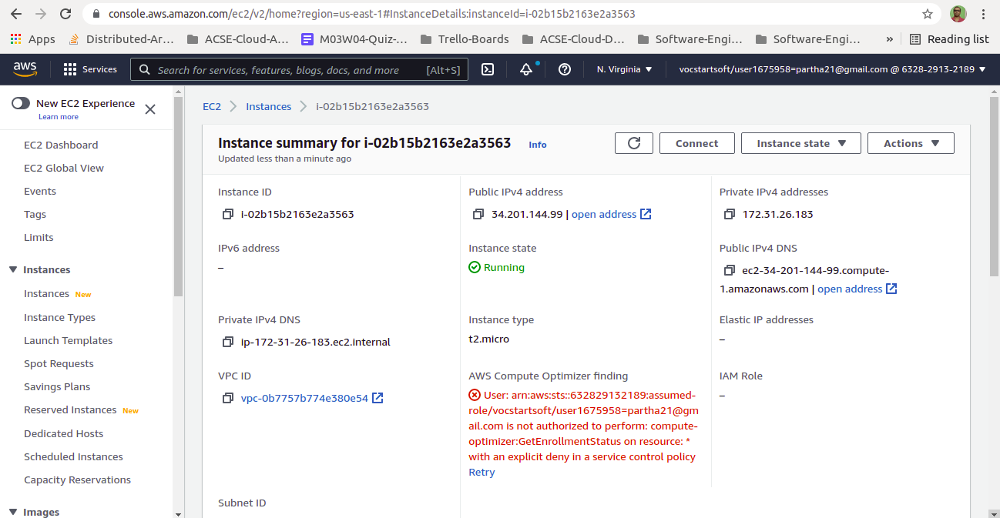
   
6. Inside connect , click on SSH client and copy the host name
   
   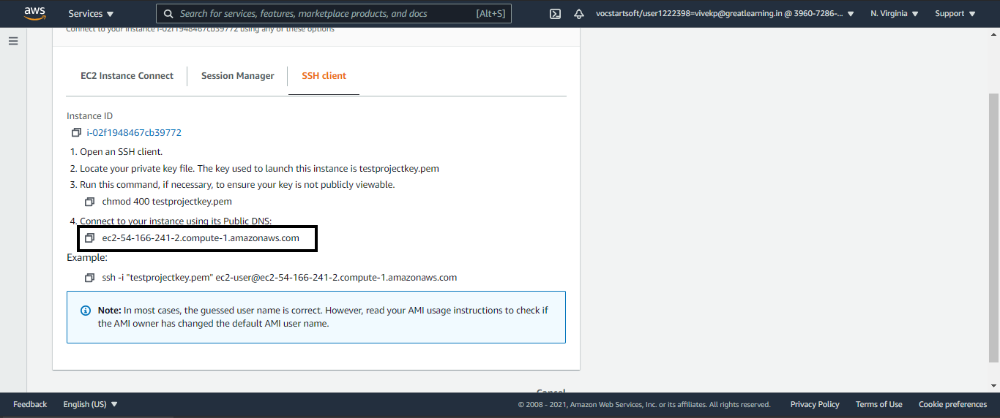
7. Open putty    
   
  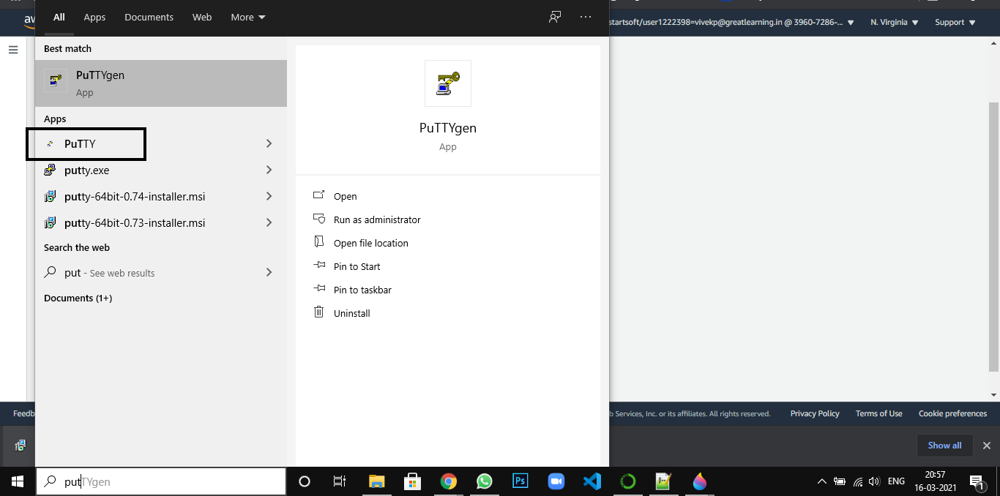
   
8. Paste the host name that you have copied in the putty    
   
   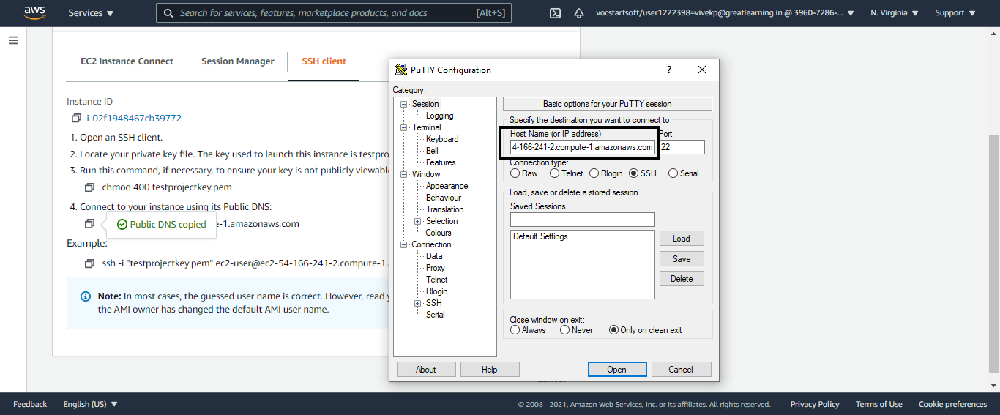
   
9. Go the SSH in the left hand side, expand it , go to Auth section  and then Browse the PPK file that you have generated in the putty gen and provide it here and click on open.

    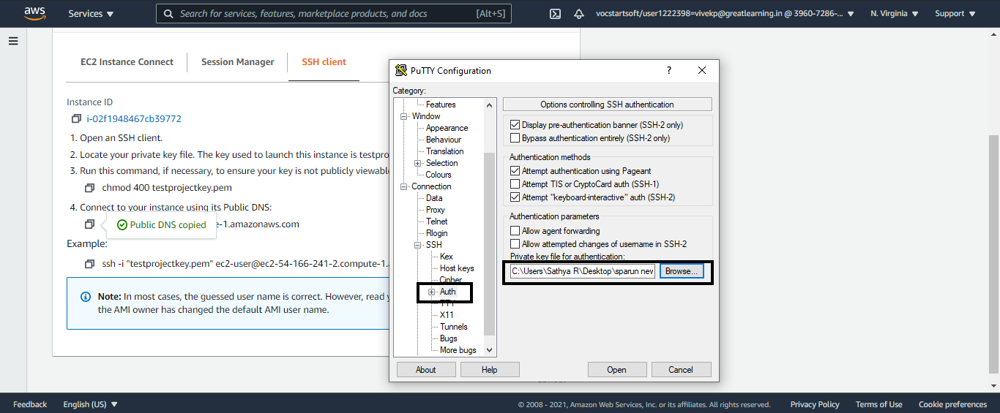
   
10. Provide the username as ec2-user ( which is available in the EC2 connect dashboard ) and press Enter.
    
    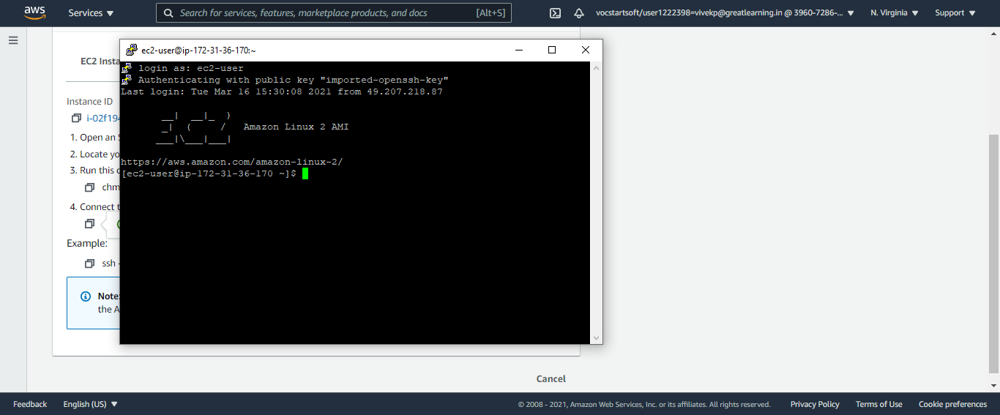
11. Now EC2 machine is connected    

# <font color='blue'>Setup and run the python code</font>

In this section, we will quickly configure the instance and copy the python code to EC2. We'll then run and verify archival creation on S3. 

1. Install the following libraries by using below commands
`
sudo yum install python37
sudo pip3 install boto3
`
      
2. After installing all the libraries, create a new directory with the name `healthcare` by typing : `mkdir healthcare`

3. Go the directory healthcare by typing ```cd healthcare```

4. Create a new file named healthcarecode.py by typing the command vim healthcarecode.py. You can of course use another text editor that you might be familiar with.

    Before copy-pasting the code, ensure the you have updated the bucket name that you have created in your account. There are column name changes done with the latest script from the previous lab, that has to be used  before you run this code. Check the columns deviceid and timestamp column present in the dynamodb table (column name is case sensitive). Below are the three lines in the script where you might need to edit with your table name, s3 bucket name and the thingtypename

`
table = dynamodb_resource.Table('bsmcloudtest')
s3.meta.client.upload_file(Filename = filename,Bucket="heatlthdata",Key=key+filename)
response = iot_client.list_things(maxResults=123, thingTypeName='HealthCare')
`
   
5. In the editor, copy paste the code which has been provided. Ensure the data is available for the previous date in the dynamo db to see the results . 

6. Exit the vim editor by doing ESC in the keyboard . Then type :wq to save and exit the vim editor 
   
7. Run the python script by typing ```python3 healthcarecode.py```

8. Verify the results by going to S3 to the bucket which you have provided. The data is arranged in folders dynamodbdata as specified earlier.
   
9. You will find a file per device id being created. If the file is large, it will take some time to transfer the complete data to S3. The files will be created per device id in S3 bucket.
   
   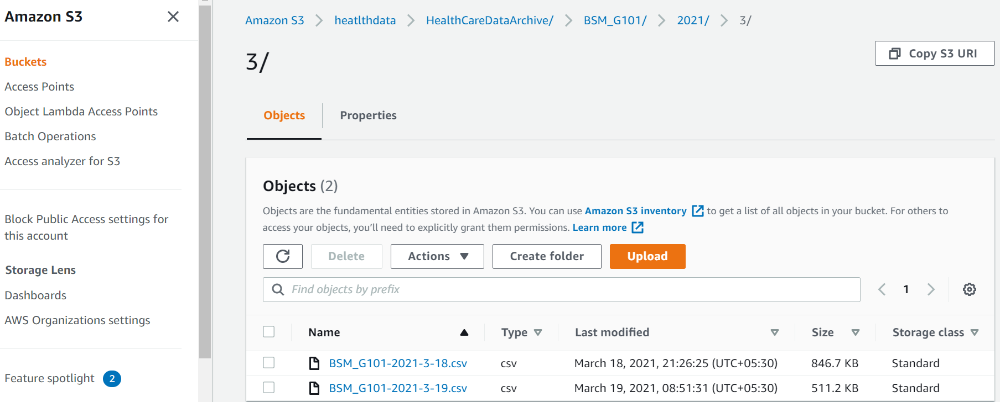
10. In case of errors or you want to fix or edit the file, use the below commands
     - vim (filename)
     - press shift+i 
     - Move the cursor using the keyboard ( mouse will not work)
     - Once editing is complete press the ESC key
     - Then press :wq to save the file 
    
    Rerun the file again 

# <font color='blue'>  Use Case 1 -  Document conversion to PDF  </font>


Cost effective - Batch processing using AWS EC2 , storing files in S3 and state information in DynamoDB.

1. Raw job data is uploaded to Amazon Simple Storage Service (S3) which is a highly-available and persistent data store.
2. AWS Lambda function will be invoked by S3 every time a new object is uploaded to the input S3 bucket.
3. AWS lambda can be used to place a job message into an Amazon SQS queue
4. The AWS Lambda function will also store state information for each job task in Amazon DynamoDB.
5. EC2 Spot can also be used with Amazon Elastic MapReduce (Amazon EMR). Worker nodes are Amazon EC2 Spot and On-demand instances on deployed Auto Scaling groups .
6. Worker nodes pick up job parts from the input queue automatically and perform single tasks based on the job task state in DynamoDB. Worker nodes will store the input objects in a file system such as Amazon Elastic File System (Amazon EFS) for processing
7. Each job can be further split into multiple  sub-parts if there is a mechanism to stitch the outputs together (as in the case of some media processing where pre-segmenting the output may be possible). Once completed, the objects will be uploaded back to S3 using multi-part upload as pdf file

   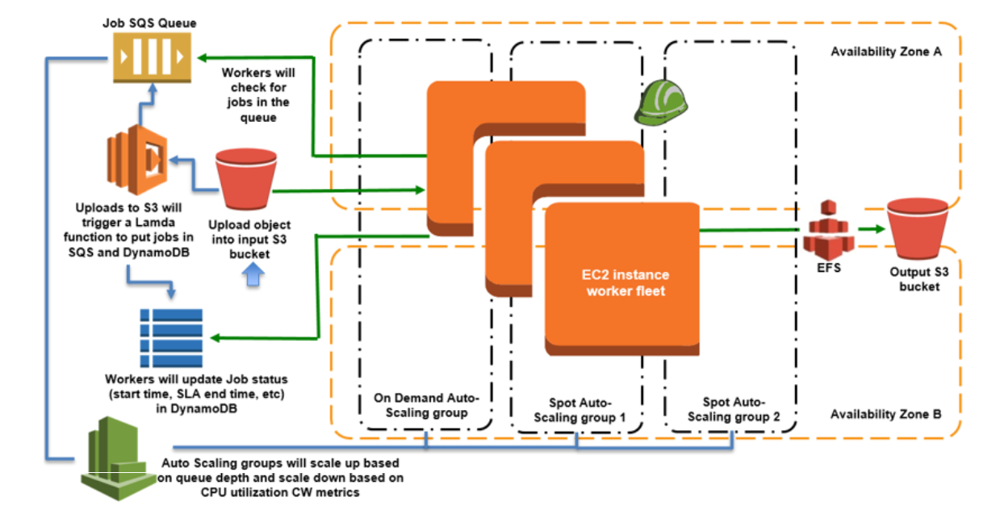

# <font color='blue'> Use Case 2 - Cloud backup and automatic lifecycle management </font>

 S3 is the perfect service for storing backups. We'll see how we can use this to reduce the load on main storage and save on cost. Some benefits:
 
 - Reduce on-premise storage for backups
 - Restore backups to EC2 or any RDS easily
 - Available in multiple availability zones
 - Lifecycle Management setup automatically reduce costs further
 
 Below is the architecture diagram for the same
 
  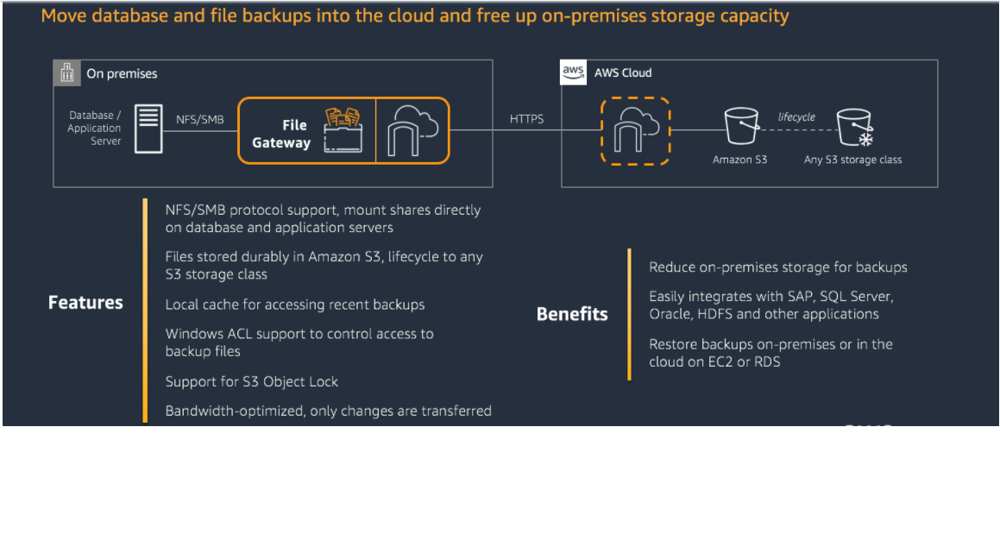
  
In typical analytical use cases, all the incoming data will generally be stored in Amazon S3.  Amazon S3 offers a range of storage classes designed for different use cases. These include 
- S3 Standard for general-purpose storage of frequently accessed data
- S3 Intelligent-Tiering for data with unknown or changing access patterns
- S3 Standard-Infrequent Access (S3 Standard-IA) for long-lived but less frequently accessed data
- S3 One Zone-Infrequent Access (S3 One Zone-IA) for long-lived, but less frequently accessed data;
- S3 Glacier for long-term archive
- S3 Glacier Deep Archive for long-term archive with longer retrieval times but cheaper cost
 
 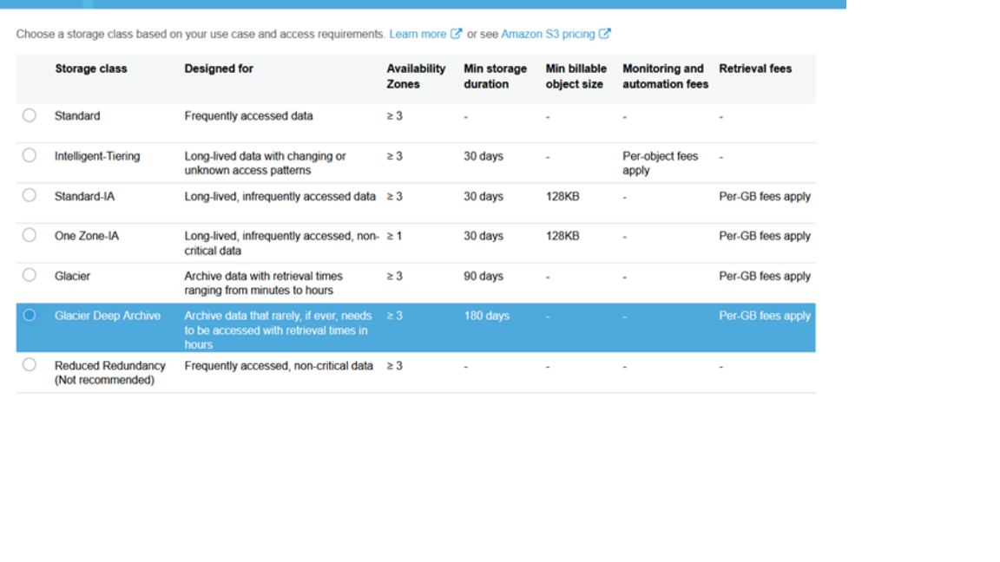
 
You will find  Storage class at the right hand side corner of the s3 bucket
   
   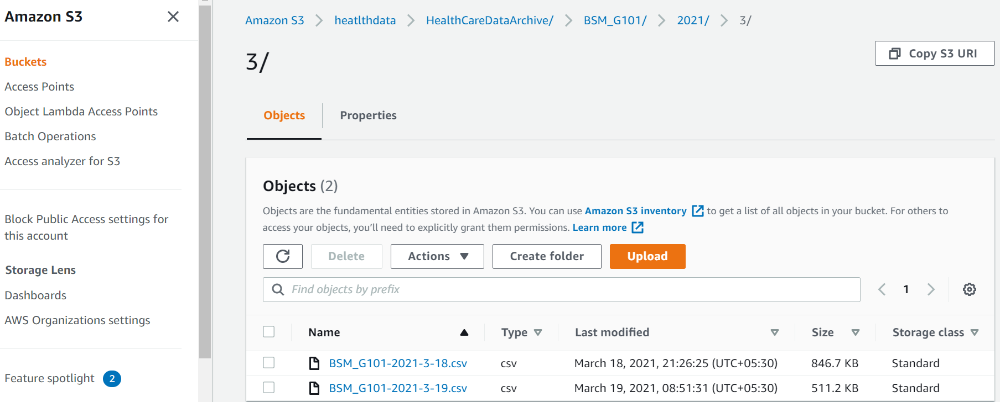
 
You can use lifecycle rules to define actions that you want Amazon S3 to take during an object's lifetime (for example, transition objects to another storage class, archive them, or delete them after a specified period of time).

- Click on the bucket name,  go to the management tab and click on Lifecycle rule

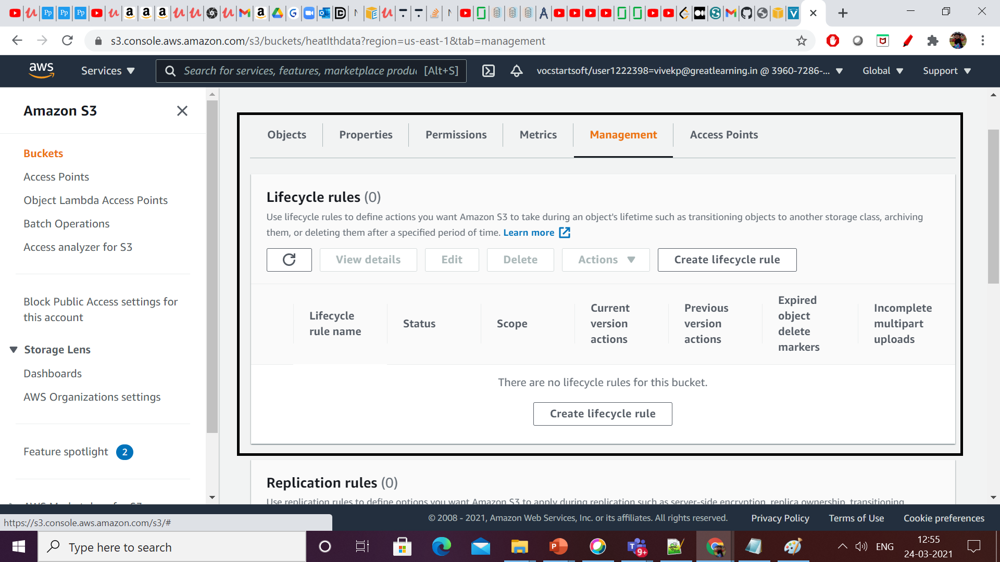

- Click on create life cycle rule button

- Provide the lifeycle name, prefix value. The prefix is the folder name that you create under bucket

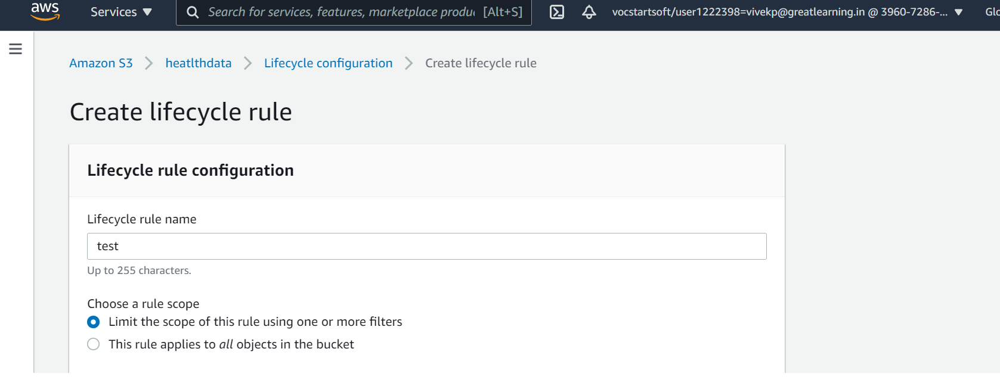

-  Click on Transition current versions of objects between storage classes under lifecycle rule actions


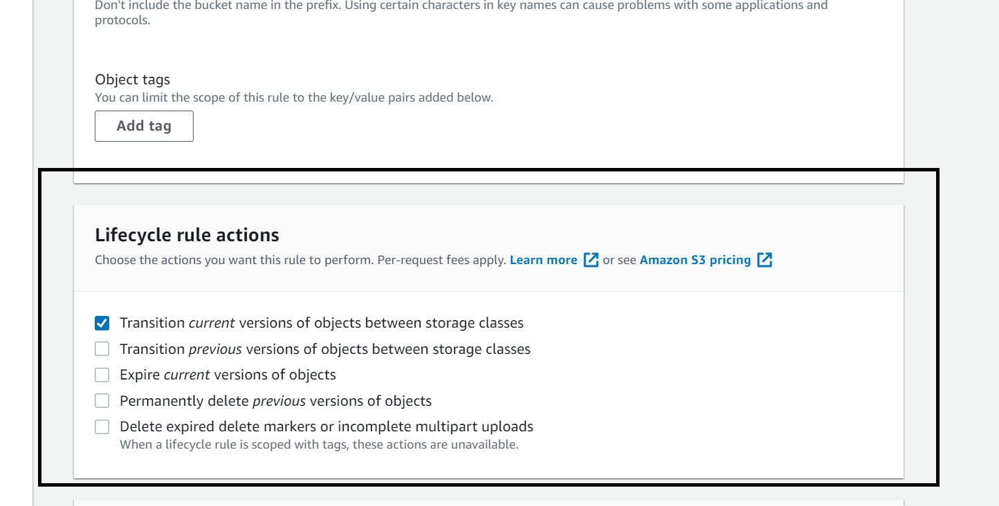

- Select StandardIA in the dropdown and give value 30 days after object creation and click on Add Trasistion


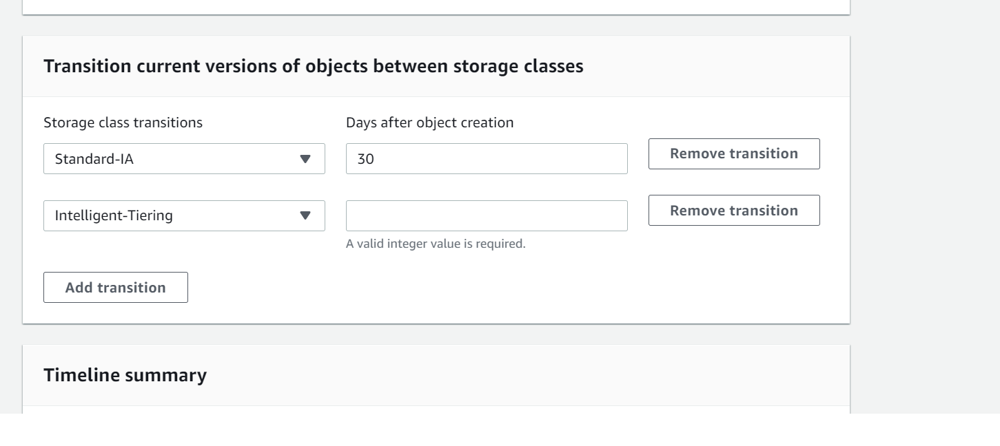

You can add multiple transistions

- Click on Create rule button . Now the rules would have been created and active


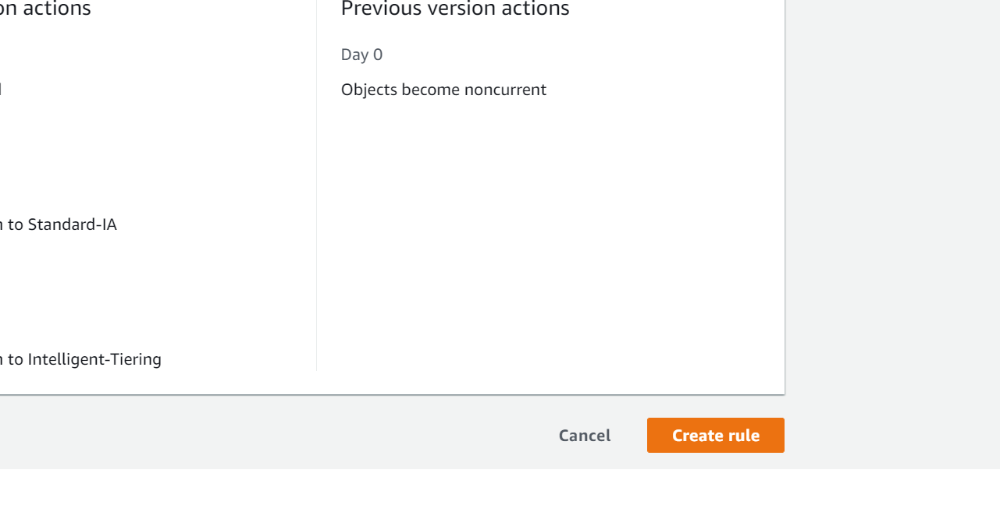

After 30 days, automatically storage class will be changed for the prefix you have mentioned from Standard to StandardIA


Please use the link for reference for setting lifecycle policies

https://docs.aws.amazon.com/AmazonS3/latest/userguide/how-to-set-lifecycle-configuration-intro.html


